In [ ]:
import os

import cv2
import keras
import numpy as np
import pandas as pd
# from scipy.misc import imread
from imageio.v2 import imread
from keras.src.layers import BatchNormalization
from keras.src.layers import Conv2D, MaxPooling2D
from keras.src.layers import Dense, Dropout, Flatten, Input
from keras.src.models import Sequential
from keras.src.optimizers import Adam

In [ ]:
# !pip install gdown  # Cài đặt thư viện gdown nếu chưa có
import gdown
from zipfile import ZipFile

# URL của tệp Google Drive (sử dụng file_id từ URL chia sẻ)
file_id = '1_3DA_viiSm847cuYPiX4opzOMTih_z9u'
url = f'https://drive.google.com/uc?id={file_id}'

# Tải tệp xuống
output = 'file.zip'
gdown.download(url, output, quiet=False)

# Giải nén tệp
with ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data')

Downloading...
From (original): https://drive.google.com/uc?id=1_3DA_viiSm847cuYPiX4opzOMTih_z9u
From (redirected): https://drive.google.com/uc?id=1_3DA_viiSm847cuYPiX4opzOMTih_z9u&confirm=t&uuid=b2584456-4fb9-4a18-8e07-fecdda624c45
To: /content/file.zip
100%|██████████| 276M/276M [00:06<00:00, 41.4MB/s]


In [ ]:
def load_data(input_size=(64, 64), data_path='/content/sample_data/GTSRB/Final_Training/Images'):
    pixels = []
    labels = []
    # Loop qua các thư mục trong thư mục Images
    for dir in os.listdir(data_path):
        if dir == '.DS_Store':
            continue

        # Đọc file csv để lấy thông tin về ảnh
        class_dir = os.path.join(data_path, dir)
        info_file = pd.read_csv(os.path.join(class_dir, "GT-" + dir + '.csv'), sep=';')

        # Lăp trong file
        for row in info_file.iterrows():
            # Đọc ảnh
            pixel = imread(os.path.join(class_dir, row[1].Filename))
            # Trích phần ROI theo thông tin trong file csv
            pixel = pixel[row[1]['Roi.X1']:row[1]['Roi.X2'], row[1]['Roi.Y1']:row[1]['Roi.Y2'], :]
            # Resize về kích cỡ chuẩn
            img = cv2.resize(pixel, input_size)

            # Thêm vào list dữ liệu
            pixels.append(img)

            # Thêm nhãn cho ảnh
            labels.append(row[1].ClassId)

    return pixels, labels

In [ ]:
pixels, labels = load_data(input_size=(64, 64))

In [ ]:
# Ảnh đầu tiên
print(pixels[0])
# 10 nhãn đầu tiên
print(labels[:10])
# Cách loại nhãn
print(set(labels))
# Số lượng ảnh
print(len(labels))
# Số loại nhãn
print(len(set(labels)))

[[[165  98  55]
  [161  99  56]
  [150 104  58]
  ...
  [165 166 153]
  [202 204 176]
  [217 219 185]]

 [[165  99  55]
  [161 100  55]
  [150 103  56]
  ...
  [152 154 140]
  [187 190 163]
  [201 205 173]]

 [[166 103  55]
  [161 103  55]
  [150 102  52]
  ...
  [119 122 107]
  [149 157 132]
  [161 170 142]]

 ...

 [[190 168 124]
  [171 154 106]
  [124 116  61]
  ...
  [156 140  95]
  [153 137  84]
  [153 136  80]]

 [[173 142  87]
  [161 134  79]
  [131 113  57]
  ...
  [ 96  96  55]
  [ 96  96  45]
  [ 96  96  41]]

 [[166 132  73]
  [157 126  68]
  [134 112  55]
  ...
  [ 72  79  39]
  [ 73  80  29]
  [ 73  80  25]]]
[4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42}
39209
43


In [ ]:
import matplotlib.pyplot as plt

def display_image(pixels, labels, index):
    """
    Hiển thị một ảnh từ dữ liệu đã load.

    :param pixels: Danh sách các ảnh đã load.
    :param labels: Danh sách các nhãn tương ứng với các ảnh.
    :param index: Chỉ số của ảnh bạn muốn hiển thị.
    """
    # Lấy ảnh và nhãn tại chỉ số đã cho
    img = pixels[index]
    label = labels[index]

    # Hiển thị ảnh sử dụng matplotlib
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Label: {label}")
    plt.axis('off')  # Ẩn trục tọa độ
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

def display_multiple_images(pixels, labels, num_images=10):
    """
    Hiển thị nhiều ảnh từ dữ liệu đã load cùng với nhãn tương ứng.

    :param pixels: Danh sách các ảnh đã load.
    :param labels: Danh sách các nhãn tương ứng với các ảnh.
    :param num_images: Số lượng ảnh muốn hiển thị.
    """
    plt.figure(figsize=(15, 5))  # Tạo khung hiển thị với kích thước tùy chỉnh

    for i in range(num_images):
        # Lấy ảnh và nhãn tại chỉ số đã cho
        img = pixels[i]
        label = labels[i]

        # Hiển thị ảnh sử dụng matplotlib
        plt.subplot(2, 5, i+1)  # Tạo lưới 2 hàng, 5 cột
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Label: {label}")
        plt.axis('off')  # Ẩn trục tọa độ

    plt.tight_layout()  # Tự động điều chỉnh khoảng cách giữa các ảnh
    plt.show()

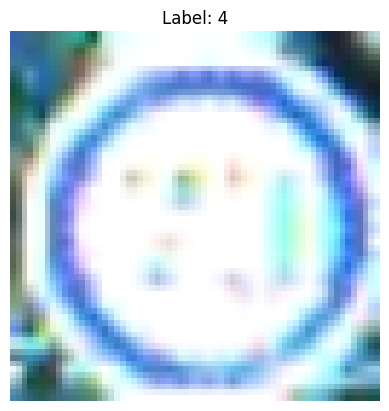

In [ ]:
display_image(pixels, labels, 0)  # Hiển thị ảnh đầu tiên trong danh sách

In [ ]:
display_multiple_images(pixels, 0, 10)

TypeError: 'int' object is not subscriptable

<Figure size 1500x500 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

def display_images_by_label(pixels, labels, target_label=1, num_images=10):
    """
    Hiển thị nhiều ảnh có cùng nhãn từ dữ liệu đã load.

    :param pixels: Danh sách các ảnh đã load.
    :param labels: Danh sách các nhãn tương ứng với các ảnh.
    :param target_label: Nhãn của các ảnh bạn muốn hiển thị.
    :param num_images: Số lượng ảnh muốn hiển thị.
    """
    # Lọc các ảnh có nhãn bằng với target_label
    filtered_images = [img for img, lbl in zip(pixels, labels) if lbl == target_label]

    # Nếu số lượng ảnh ít hơn yêu cầu, chỉ hiển thị số lượng có sẵn
    num_images = min(num_images, len(filtered_images))

    plt.figure(figsize=(15, 5))  # Tạo khung hiển thị với kích thước tùy chỉnh

    for i in range(num_images):
        img = filtered_images[i]

        # Hiển thị ảnh sử dụng matplotlib
        plt.subplot(5, 5, i+1)  # Tạo lưới 2 hàng, 5 cột
        plt.imshow(img)
        plt.title(f"Label: {target_label}")
        plt.axis('off')  # Ẩn trục tọa độ

    plt.tight_layout()  # Tự động điều chỉnh khoảng cách giữa các ảnh
    plt.show()


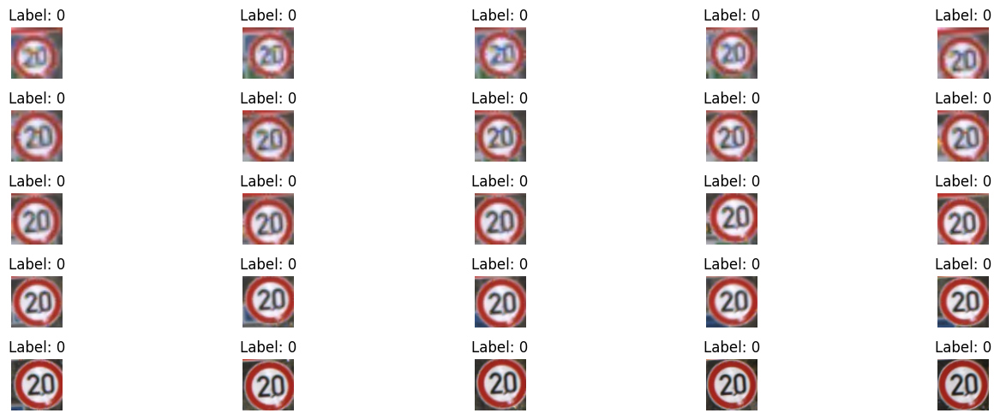

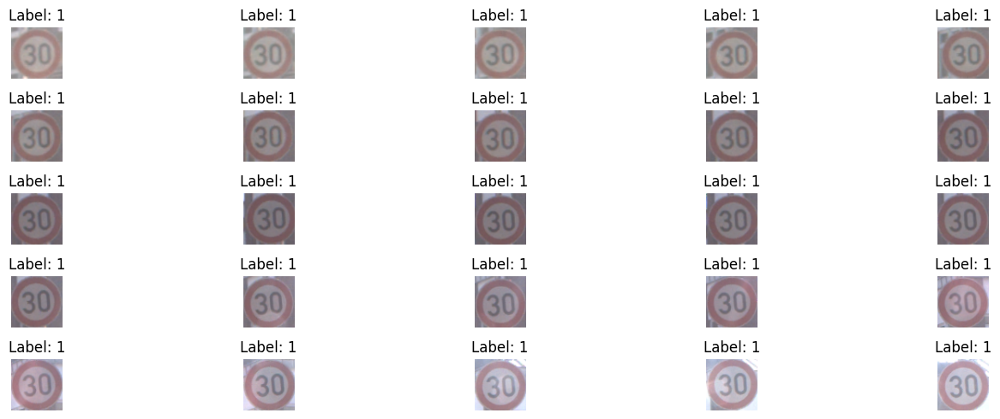

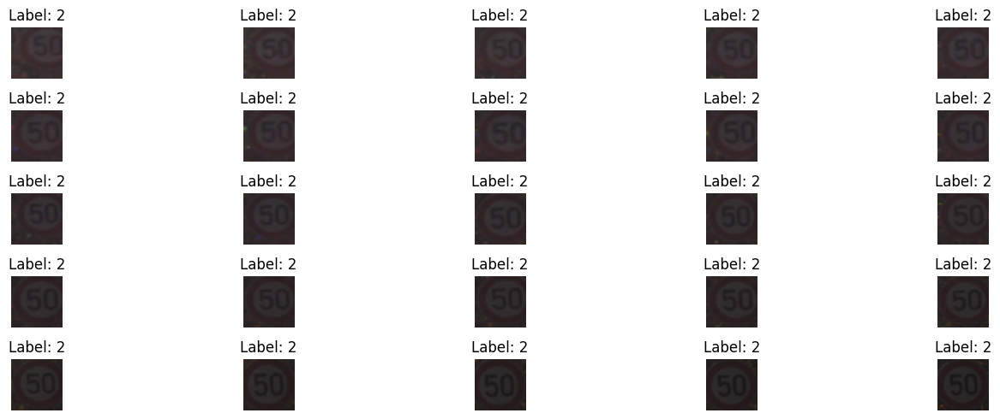

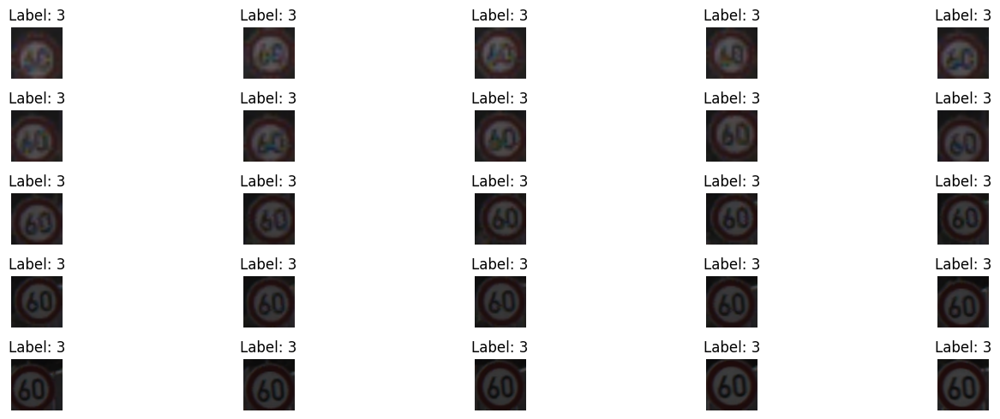

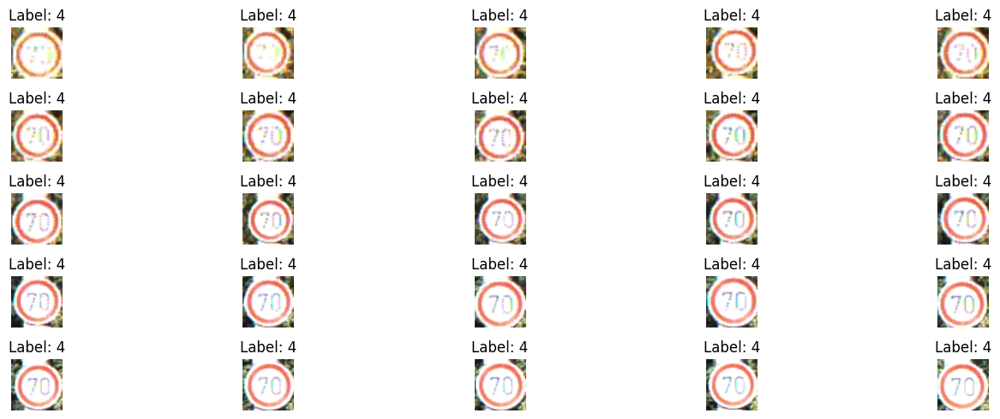

...

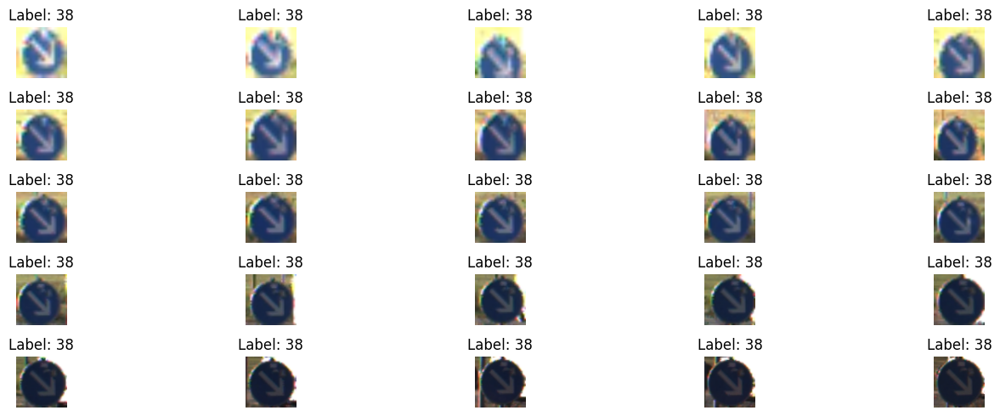

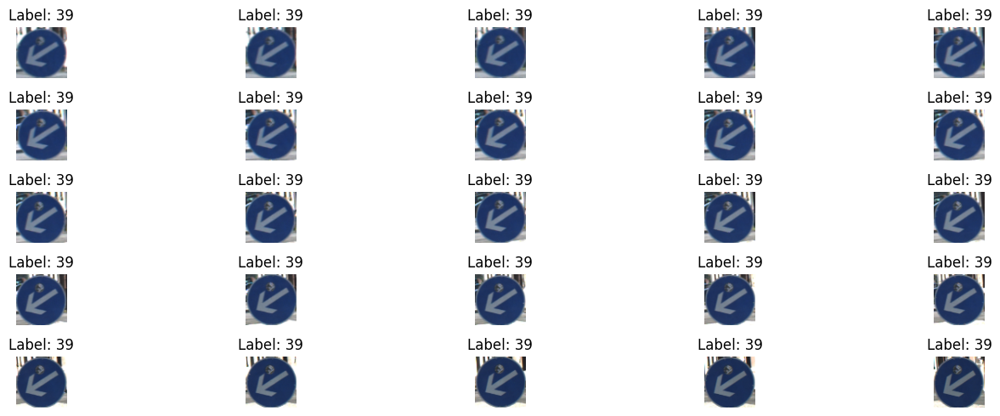

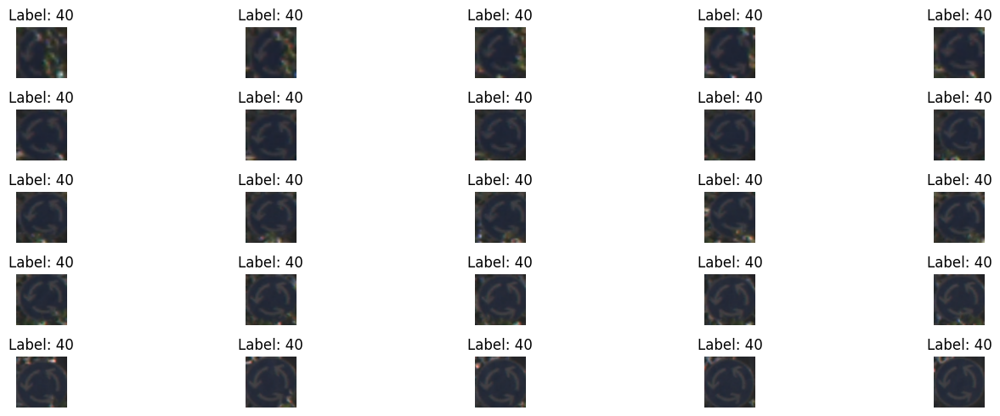

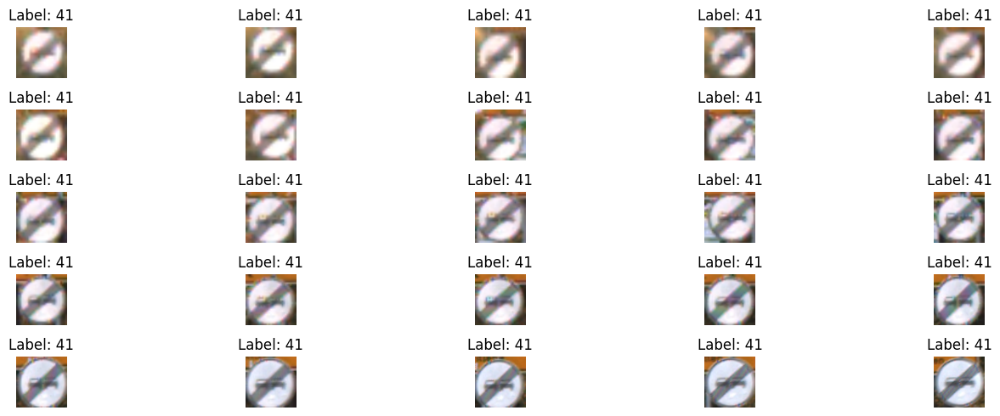

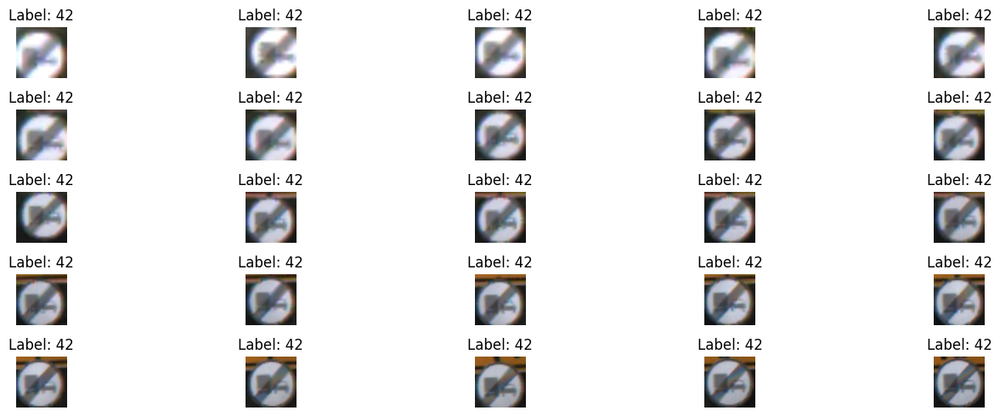

<Figure size 1500x500 with 0 Axes>

In [ ]:
for i in range(44):
    display_images_by_label(pixels, labels, target_label=i, num_images=25)  # Hiển thị 10 ảnh có label = 1

In [ ]:
# Đường dẫn ảnh
data_path = '/content/sample_data/GTSRB/Final_Training/Images'
# pixels, labels = load_data(data_path=data_path)


def split_train_val_test_data(pixels, labels):
    # Chuẩn hoá dữ liệu pixels và labels
    pixels = np.array(pixels)
    labels = keras.utils.to_categorical(labels)

    # Nhào trộn dữ liệu ngẫu nhiên
    randomize = np.arange(len(pixels))
    np.random.shuffle(randomize)
    X = pixels[randomize]
    print("X=", X.shape)
    y = labels[randomize]

    # Chia dữ liệu theo tỷ lệ 60% train và 40% còn lại cho val và test
    train_size = int(X.shape[0] * 0.6)
    X_train, X_val = X[:train_size], X[train_size:]
    y_train, y_val = y[:train_size], y[train_size:]

    val_size = int(X_val.shape[0] * 0.5)  # 50% của phần 40% bên trên
    X_val, X_test = X_val[:val_size], X_val[val_size:]
    y_val, y_test = y_val[:val_size], y_val[val_size:]

    return X_train, y_train, X_val, y_val, X_test, y_test


X_train, y_train, X_val, y_val, X_test, y_test = split_train_val_test_data(pixels, labels)

X= (39209, 64, 64, 3)


In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)

(23525, 64, 64, 3)
(23525, 43)
(7842, 64, 64, 3)
(7842, 43)
(7842, 64, 64, 3)
(7842, 43)


In [ ]:
def build_model(input_shape=(64, 64, 3), filter_size=(3, 3), pool_size=(2, 2), output_size=43):
    model = Sequential([
        Input(shape=input_shape),
        Conv2D(16, filter_size, activation='relu', input_shape=input_shape, padding='same'),
        BatchNormalization(),
        Conv2D(16, filter_size, activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=pool_size),
        Dropout(0.2),
        Conv2D(32, filter_size, activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(32, filter_size, activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=pool_size),
        Dropout(0.2),
        Conv2D(64, filter_size, activation='relu', padding='same'),
        BatchNormalization(),
        Conv2D(64, filter_size, activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=pool_size),
        Dropout(0.2),
        Flatten(),
        Dense(2048, activation='relu'),
        Dropout(0.3),
        Dense(1024, activation='relu'),
        Dropout(0.3),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(output_size, activation='softmax')
    ])

    model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=1e-4), metrics=['accuracy'])
    model.summary()
    return model

In [ ]:
# Build model với kích thước đầu vào 64x64 và output là 43 classes
model = build_model(input_shape=(64, 64, 3), output_size=43)

# Train model
epochs = 10
batch_size = 16 * 8

model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 64, 64, 16)        64        
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 16)        2320      
                                                                 
 batch_normalization_1 (Bat  (None, 64, 64, 16)        64        
 chNormalization)                                                
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                        

In [ ]:
model.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model.h5")
model.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model.keras")
# model = keras.models.load_model("traffic_sign_model.h5")

In [ ]:
import matplotlib.pyplot as plt

def plot_his(his):
    # summarize history for accuracy
    plt.plot(his.history['accuracy'])
    plt.plot(his.history['val_accuracy'])
    plt.title('model accuracy')
    plt.xlabel('accuracy')
    plt.ylabel('epoch')
    plt.legend(['training', 'validation'], loc='upper left')
    plt.show()

    # summarize history for loss
    plt.plot(his.history['loss'])
    plt.plot(his.history['val_loss'])
    plt.title('model loss')
    plt.xlabel('loss')
    plt.ylabel('epoch')
    plt.legend(['training', 'validation'], loc='upper left')
    plt.show()

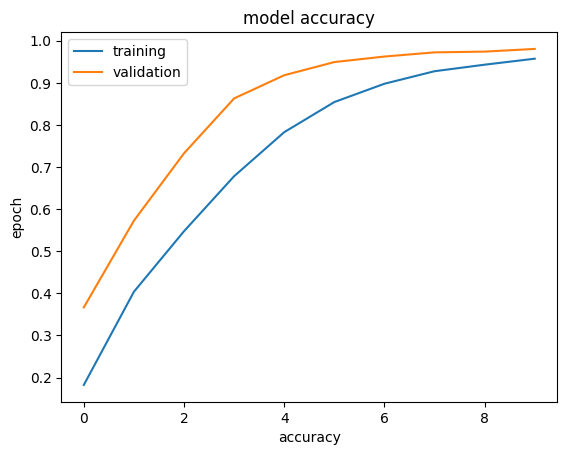

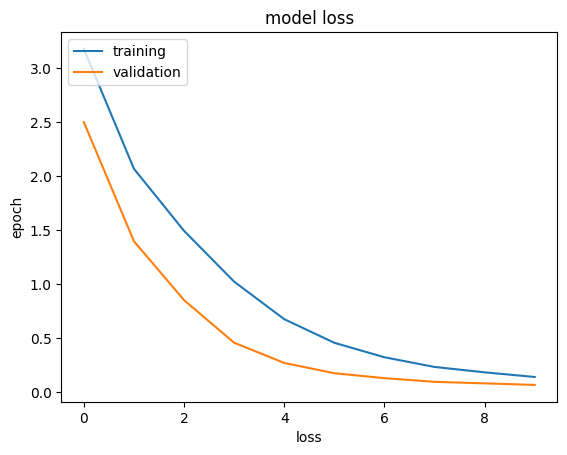

In [ ]:
plot_his(model.history)

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Tải ResNet50 với trọng số từ ImageNet, nhưng không bao gồm các lớp fully connected ở cuối (include_top=False)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

# Thêm các lớp Fully Connected cho bài toán phân loại của bạn
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Lớp pooling toàn cục
x = Dense(1024, activation='relu')(x)  # Lớp fully connected
predictions = Dense(43, activation='softmax')(x)  # Lớp đầu ra với số lớp bằng output_size

# Định nghĩa mô hình mới
model_resnet50 = Model(inputs=base_model.input, outputs=predictions)

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
model_resnet50.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Huấn luyện mô hình
model_resnet50.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val))

Epoch 1/10
184/184 [==============================] - 49s 253ms/step - loss: 1.3458 - accuracy: 0.6188 - val_loss: 0.7567 - val_accuracy: 0.7642
Epoch 2/10
184/184 [==============================] - 47s 257ms/step - loss: 0.5458 - accuracy: 0.8362 - val_loss: 0.4933 - val_accuracy: 0.8472
Epoch 3/10
184/184 [==============================] - 48s 263ms/step - loss: 0.3641 - accuracy: 0.8956 - val_loss: 0.4047 - val_accuracy: 0.8768
Epoch 4/10
184/184 [==============================] - 44s 241ms/step - loss: 0.2719 - accuracy: 0.9268 - val_loss: 0.3528 - val_accuracy: 0.8914
Epoch 5/10
184/184 [==============================] - 47s 255ms/step - loss: 0.2110 - accuracy: 0.9481 - val_loss: 0.3103 - val_accuracy: 0.9074
Epoch 6/10
184/184 [==============================] - 44s 241ms/step - loss: 0.1726 - accuracy: 0.9588 - val_loss: 0.2729 - val_accuracy: 0.9169
Epoch 7/10
184/184 [==============================] - 44s 241ms/step - loss: 0.1379 - accuracy: 0.9701 - val_loss: 0.2592 - val_ac

In [ ]:
model_resnet50.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_resnet.h5")
model_resnet50.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_resnet.keras")

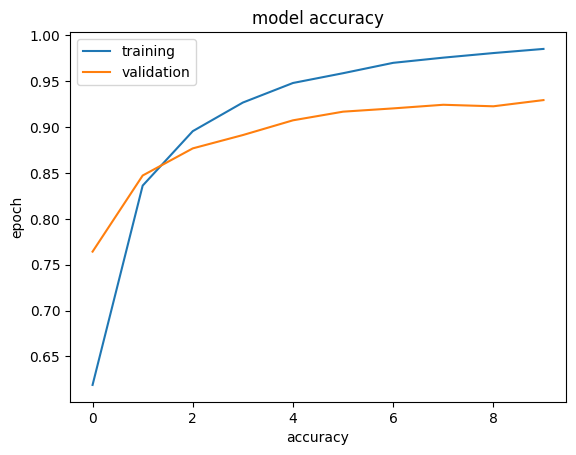

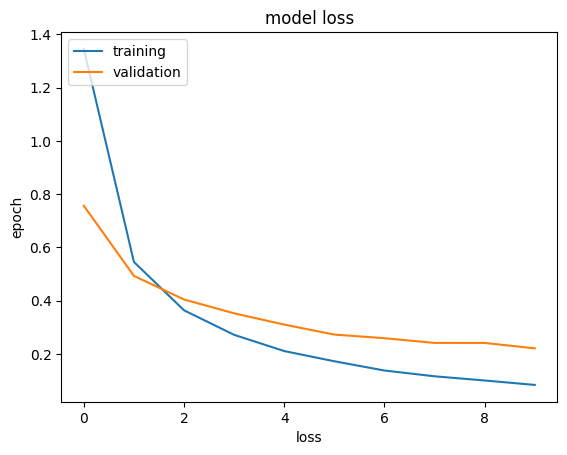

In [ ]:
plot_his(model_resnet50.history)

In [ ]:
# Mở khóa các lớp cuối cùng
for layer in base_model.layers[-10:]:
    layer.trainable = True

# Biên dịch lại mô hình và tiếp tục huấn luyện
model_resnet50.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model_resnet50.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_val, y_val))

Epoch 1/10
184/184 [==============================] - 65s 332ms/step - loss: 0.1961 - accuracy: 0.9512 - val_loss: 0.2540 - val_accuracy: 0.9277
Epoch 2/10
184/184 [==============================] - 62s 339ms/step - loss: 0.1234 - accuracy: 0.9779 - val_loss: 0.2408 - val_accuracy: 0.9304
Epoch 3/10
184/184 [==============================] - 61s 330ms/step - loss: 0.0927 - accuracy: 0.9869 - val_loss: 0.2205 - val_accuracy: 0.9343
Epoch 4/10
184/184 [==============================] - 61s 334ms/step - loss: 0.0737 - accuracy: 0.9912 - val_loss: 0.2075 - val_accuracy: 0.9379
Epoch 5/10
184/184 [==============================] - 61s 335ms/step - loss: 0.0574 - accuracy: 0.9955 - val_loss: 0.1948 - val_accuracy: 0.9407
Epoch 6/10
184/184 [==============================] - 61s 330ms/step - loss: 0.0469 - accuracy: 0.9969 - val_loss: 0.1869 - val_accuracy: 0.9430
Epoch 7/10
184/184 [==============================] - 60s 324ms/step - loss: 0.0376 - accuracy: 0.9985 - val_loss: 0.1785 - val_ac

In [ ]:
model_resnet50.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_resnet2.h5")
model_resnet50.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_resnet2.keras")

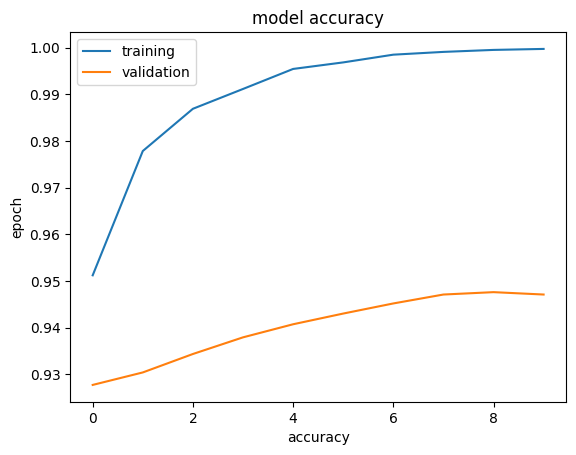

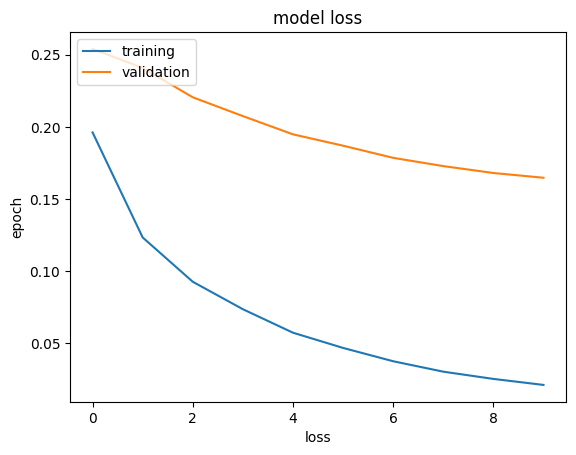

In [ ]:
plot_his(model_resnet50.history)

In [ ]:
from tensorflow.keras.applications import VGG16

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(64, 64, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(43, activation='softmax')(x)

model_vgg16 = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model_vgg16.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])


58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
model_vgg16.fit(X_train, y_train, epochs=10, batch_size=128, validation_data=(X_val, y_val))

Epoch 1/10
184/184 [==============================] - 51s 275ms/step - loss: 3.0337 - accuracy: 0.4250 - val_loss: 1.4142 - val_accuracy: 0.6150
Epoch 2/10
184/184 [==============================] - 49s 265ms/step - loss: 1.0416 - accuracy: 0.7041 - val_loss: 0.9503 - val_accuracy: 0.7294
Epoch 3/10
184/184 [==============================] - 51s 276ms/step - loss: 0.7149 - accuracy: 0.7942 - val_loss: 0.7749 - val_accuracy: 0.7851
Epoch 4/10
184/184 [==============================] - 52s 282ms/step - loss: 0.5486 - accuracy: 0.8451 - val_loss: 0.6616 - val_accuracy: 0.8137
Epoch 5/10
184/184 [==============================] - 52s 283ms/step - loss: 0.4474 - accuracy: 0.8752 - val_loss: 0.6108 - val_accuracy: 0.8285
Epoch 6/10
184/184 [==============================] - 51s 277ms/step - loss: 0.3794 - accuracy: 0.8965 - val_loss: 0.5583 - val_accuracy: 0.8432
Epoch 7/10
184/184 [==============================] - 51s 277ms/step - loss: 0.3268 - accuracy: 0.9157 - val_loss: 0.5103 - val_ac

In [ ]:
model_vgg16.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_vgg16.h5")
model_vgg16.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_vgg16.keras")

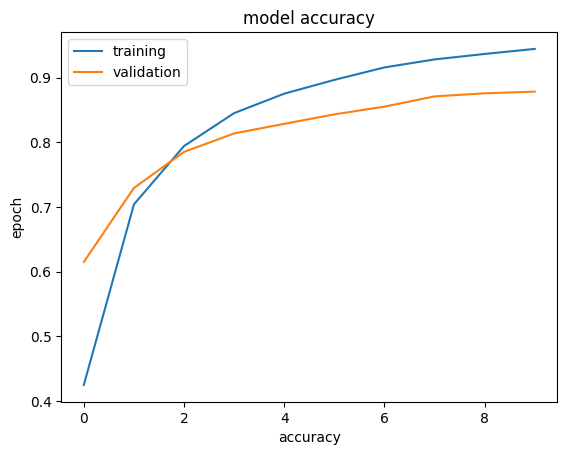

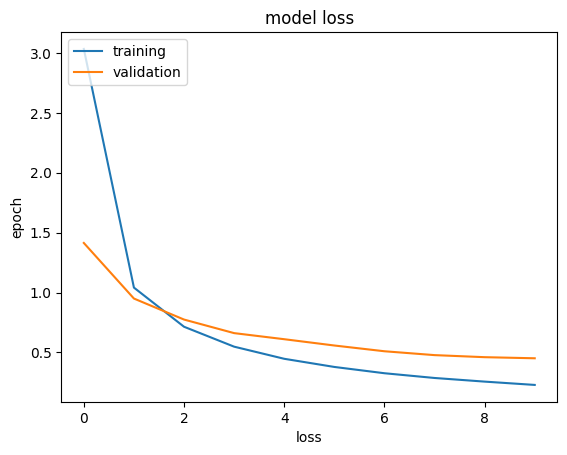

In [ ]:
plot_his(model_vgg16.history)

In [ ]:
# Mở khóa các lớp cuối cùng trong VGG16 để fine-tuning
for layer in base_model.layers[-4:]:
    layer.trainable = True

# Biên dịch lại mô hình sau khi mở khóa
model_vgg16.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

# Tiếp tục huấn luyện
model_vgg16.fit(X_train, y_train, epochs=10, batch_size=128, validation_data=(X_val, y_val))


Epoch 1/10
184/184 [==============================] - 91s 487ms/step - loss: 0.1517 - accuracy: 0.9581 - val_loss: 0.3015 - val_accuracy: 0.9217
Epoch 2/10
184/184 [==============================] - 89s 483ms/step - loss: 0.0726 - accuracy: 0.9813 - val_loss: 0.2661 - val_accuracy: 0.9351
Epoch 3/10
184/184 [==============================] - 89s 482ms/step - loss: 0.0431 - accuracy: 0.9896 - val_loss: 0.2394 - val_accuracy: 0.9425
Epoch 4/10
184/184 [==============================] - 90s 491ms/step - loss: 0.0279 - accuracy: 0.9944 - val_loss: 0.2318 - val_accuracy: 0.9477
Epoch 5/10
184/184 [==============================] - 90s 488ms/step - loss: 0.0173 - accuracy: 0.9974 - val_loss: 0.2154 - val_accuracy: 0.9526
Epoch 6/10
184/184 [==============================] - 90s 489ms/step - loss: 0.0129 - accuracy: 0.9983 - val_loss: 0.2207 - val_accuracy: 0.9540
Epoch 7/10
184/184 [==============================] - 90s 491ms/step - loss: 0.0091 - accuracy: 0.9993 - val_loss: 0.2336 - val_ac

In [ ]:
model_vgg16.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_vgg162.h5")
model_vgg16.save("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_vgg162.keras")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


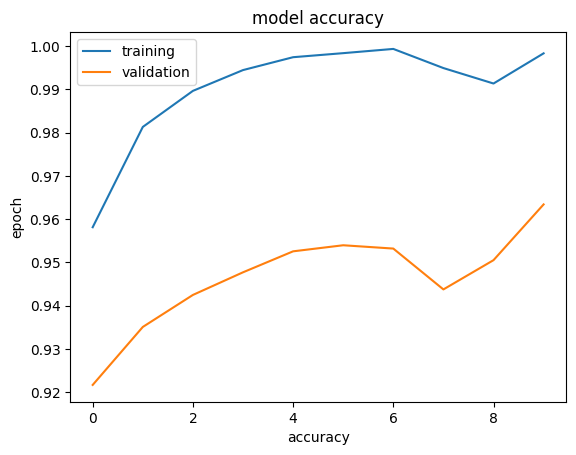

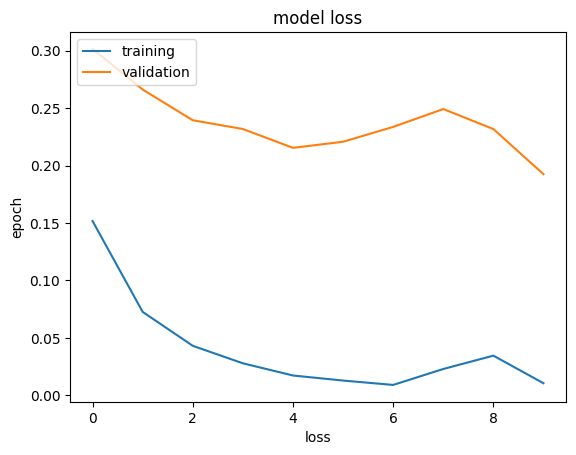

In [ ]:
plot_his(model_vgg16.history)

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

In [ ]:
df = pd.read_csv('/content/signnames.csv')

In [ ]:
class_names = []
for i in df['SignName']:
    class_names.append(i)

In [ ]:
model.predict(X_test)

246/246 [==============================] - 4s 16ms/step


array([[1.10189045e-10, 7.57563157e-07, 6.99729625e-08, ...,
        4.01843652e-13, 1.48092892e-11, 5.03863440e-09],
       [2.51312042e-04, 9.02602824e-06, 3.82475992e-06, ...,
        9.37220292e-08, 4.18267200e-06, 7.41034341e-07],
       [4.34361026e-03, 9.44735587e-01, 1.13185588e-02, ...,
        3.08293267e-04, 8.39668355e-05, 6.59690122e-05],
       ...,
       [7.26331495e-11, 9.88103324e-08, 3.50306202e-08, ...,
        1.40411059e-14, 7.73923135e-13, 8.92730612e-10],
       [1.32729296e-11, 6.03274142e-09, 1.12877911e-08, ...,
        3.67069139e-15, 4.56088834e-13, 6.72638722e-10],
       [1.80366247e-14, 2.15520012e-14, 1.02370119e-10, ...,
        4.79620633e-15, 6.77088932e-14, 1.77703492e-17]], dtype=float32)

In [ ]:
# Kiểm tra model với dữ liệu mới
print(model.evaluate(X_test, y_test))

246/246 [==============================] - 4s 18ms/step - loss: 0.0712 - accuracy: 0.9807
[0.07117994874715805, 0.9807447195053101]


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred = model.predict(X_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes = np.argmax(y_pred, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true = np.argmax(y_test, axis=1)

246/246 [==============================] - 5s 21ms/step


In [ ]:
# Tạo bảng classification_report
report = classification_report(y_true, y_pred_classes, target_names=class_names)

# In ra bảng classification_report
print(report)

                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       1.00      0.95      0.97        37
                              Speed limit (30km/h)       0.99      0.97      0.98       449
                              Speed limit (50km/h)       0.99      0.96      0.97       435
                              Speed limit (60km/h)       0.98      0.95      0.97       276
                              Speed limit (70km/h)       0.98      0.99      0.99       366
                              Speed limit (80km/h)       0.95      0.98      0.96       377
                       End of speed limit (80km/h)       1.00      1.00      1.00       100
                             Speed limit (100km/h)       0.98      0.96      0.97       314
                             Speed limit (120km/h)       0.94      0.97      0.96       264
                                        No passing       0.97      0.99      0.

In [ ]:
model_resnet50.predict(X_test)

246/246 [==============================] - 20s 79ms/step


array([[6.91367035e-08, 1.71079421e-07, 1.32540634e-09, ...,
        3.10485611e-08, 3.86107057e-09, 8.29456965e-08],
       [3.94242234e-12, 1.48980356e-10, 2.63754448e-12, ...,
        1.64711314e-10, 5.04656299e-12, 3.76782106e-10],
       [8.85931286e-07, 9.98202980e-01, 8.42890586e-06, ...,
        3.57097042e-06, 4.40801296e-06, 1.89525636e-05],
       ...,
       [1.14284241e-07, 6.80972301e-09, 8.54524984e-09, ...,
        2.41509346e-09, 1.65130076e-09, 3.56754781e-09],
       [1.97645932e-06, 1.30954013e-05, 2.40458030e-05, ...,
        5.28789542e-07, 9.90540502e-06, 5.17436965e-05],
       [1.75322534e-09, 2.51604568e-08, 3.70895958e-09, ...,
        7.49710807e-07, 1.51558355e-09, 1.29248905e-08]], dtype=float32)

In [ ]:
# Kiểm tra model với dữ liệu mới
print(model_resnet50.evaluate(X_test, y_test))

246/246 [==============================] - 20s 79ms/step - loss: 0.1698 - accuracy: 0.9457
[0.16977961361408234, 0.9456771016120911]


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred_resnet50 = model_resnet50.predict(X_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes_resnet50 = np.argmax(y_pred_resnet50, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true_resnet50 = np.argmax(y_test, axis=1)

246/246 [==============================] - 19s 77ms/step


In [ ]:
# Tạo bảng classification_report
report_resnet50 = classification_report(y_true_resnet50, y_pred_classes_resnet50, target_names=class_names)

# In ra bảng classification_report
print(report_resnet50)

                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.97      0.86      0.91        37
                              Speed limit (30km/h)       0.92      0.92      0.92       449
                              Speed limit (50km/h)       0.87      0.91      0.89       435
                              Speed limit (60km/h)       0.90      0.92      0.91       276
                              Speed limit (70km/h)       0.92      0.94      0.93       366
                              Speed limit (80km/h)       0.91      0.88      0.89       377
                       End of speed limit (80km/h)       0.99      0.99      0.99       100
                             Speed limit (100km/h)       0.93      0.91      0.92       314
                             Speed limit (120km/h)       0.92      0.90      0.91       264
                                        No passing       0.98      0.98      0.

In [ ]:
model_vgg16.predict(X_test)

246/246 [==============================] - 19s 76ms/step


array([[5.6621113e-19, 4.0021597e-13, 5.3062085e-13, ..., 2.9297357e-24,
        2.2742327e-17, 3.3775620e-25],
       [5.7845964e-13, 3.8258086e-12, 7.3717858e-11, ..., 1.0707527e-14,
        3.8980043e-14, 9.4352705e-16],
       [1.1636005e-14, 9.9999887e-01, 5.1794927e-12, ..., 1.4181848e-18,
        1.6577331e-13, 4.0554067e-13],
       ...,
       [0.0000000e+00, 0.0000000e+00, 6.2008843e-37, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [1.4382688e-25, 4.6457707e-15, 6.3163238e-12, ..., 2.3842425e-37,
        7.7159722e-31, 1.5586303e-34],
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.4844411e-38,
        0.0000000e+00, 0.0000000e+00]], dtype=float32)

In [ ]:
# Kiểm tra model với dữ liệu mới
print(model_vgg16.evaluate(X_test, y_test))

246/246 [==============================] - 19s 79ms/step - loss: 0.2016 - accuracy: 0.9579
[0.20159317553043365, 0.9579188823699951]


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred_vgg16 = model_vgg16.predict(X_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes_vgg16 = np.argmax(y_pred_vgg16, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true_vgg16 = np.argmax(y_test, axis=1)

# Tạo bảng classification_report
report_vgg16 = classification_report(y_true_vgg16, y_pred_classes_vgg16, target_names=class_names)

# In ra bảng classification_report
print(report_vgg16)

246/246 [==============================] - 19s 78ms/step
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.91      0.78      0.84        37
                              Speed limit (30km/h)       0.95      0.91      0.93       449
                              Speed limit (50km/h)       0.93      0.93      0.93       435
                              Speed limit (60km/h)       0.95      0.94      0.94       276
                              Speed limit (70km/h)       0.93      0.98      0.96       366
                              Speed limit (80km/h)       0.93      0.93      0.93       377
                       End of speed limit (80km/h)       1.00      0.97      0.98       100
                             Speed limit (100km/h)       0.99      0.94      0.96       314
                             Speed limit (120km/h)       0.95      0.95      0.95       264
                      

In [ ]:
import tensorflow.keras.models

In [ ]:
model_resnet50 = tensorflow.keras.models.load_model("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_resnet.h5")

In [ ]:
model_resnet50.predict(X_test)

246/246 [==============================] - 19s 76ms/step


array([[5.6621113e-19, 4.0021597e-13, 5.3062085e-13, ..., 2.9297357e-24,
        2.2742327e-17, 3.3775620e-25],
       [5.7845964e-13, 3.8258086e-12, 7.3717858e-11, ..., 1.0707527e-14,
        3.8980043e-14, 9.4352705e-16],
       [1.1636005e-14, 9.9999887e-01, 5.1794927e-12, ..., 1.4181848e-18,
        1.6577331e-13, 4.0554067e-13],
       ...,
       [0.0000000e+00, 0.0000000e+00, 6.2008843e-37, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [1.4382688e-25, 4.6457707e-15, 6.3163238e-12, ..., 2.3842425e-37,
        7.7159722e-31, 1.5586303e-34],
       [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 1.4844411e-38,
        0.0000000e+00, 0.0000000e+00]], dtype=float32)

In [ ]:
# Giả sử bạn đã biên dịch mô hình với các metrics
model_resnet50.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Đánh giá mô hình trên tập dữ liệu test
loss, accuracy = model_resnet50.evaluate(X_test, y_test)

print(f"Loss: {loss}, Accuracy: {accuracy}")

# Kiểm tra model với dữ liệu mới
print(model_resnet50.evaluate(X_test, y_test))

246/246 ━━━━━━━━━━━━━━━━━━━━ 150s 597ms/step - accuracy: 0.9788 - loss: 0.0733
Loss: 0.07667098939418793, Accuracy: 0.9787043929100037
246/246 ━━━━━━━━━━━━━━━━━━━━ 132s 532ms/step - accuracy: 0.9788 - loss: 0.0733
[0.07667098939418793, 0.9787043929100037]


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred_resnet50 = model_resnet50.predict(X_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes_resnet50 = np.argmax(y_pred_resnet50, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true_resnet50 = np.argmax(y_test, axis=1)

# Tạo bảng classification_report
report_resnet50 = classification_report(y_true_resnet50, y_pred_classes_resnet50, target_names=class_names)

# In ra bảng classification_report
print(report_resnet50)

246/246 ━━━━━━━━━━━━━━━━━━━━ 124s 503ms/step
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       1.00      0.96      0.98        46
                              Speed limit (30km/h)       0.97      0.97      0.97       433
                              Speed limit (50km/h)       0.95      0.98      0.96       421
                              Speed limit (60km/h)       0.96      0.96      0.96       255
                              Speed limit (70km/h)       0.97      0.98      0.98       408
                              Speed limit (80km/h)       0.96      0.95      0.96       373
                       End of speed limit (80km/h)       1.00      0.97      0.99        80
                             Speed limit (100km/h)       0.98      0.97      0.97       301
                             Speed limit (120km/h)       0.98      0.95      0.97       278
                                  

In [ ]:
model_vgg16 = keras.models.load_model("/content/drive/MyDrive/DoAnChuyenNganh/traffic_sign_model_vgg16.h5")

In [ ]:
model_vgg16.predict(X_test)

246/246 ━━━━━━━━━━━━━━━━━━━━ 406s 2s/step


array([[1.07871750e-02, 2.45349724e-02, 3.71579863e-02, ...,
        6.33137606e-05, 6.55914264e-05, 6.54237783e-06],
       [1.16730889e-03, 7.58812064e-03, 9.65744257e-03, ...,
        5.34024909e-02, 2.96192849e-03, 2.81863660e-03],
       [2.76760602e-06, 1.26255909e-03, 9.98655617e-01, ...,
        3.74318021e-16, 1.26834594e-16, 1.35324473e-18],
       ...,
       [4.42143610e-05, 1.29718528e-05, 3.72510513e-05, ...,
        1.48065033e-06, 1.30407317e-02, 2.98412377e-03],
       [4.46605739e-08, 3.26595497e-08, 1.00533795e-08, ...,
        4.24621492e-12, 7.83982017e-08, 3.09482662e-09],
       [4.96305933e-04, 2.39521483e-04, 4.18413460e-04, ...,
        1.82943550e-04, 1.82316115e-03, 1.03798299e-03]], dtype=float32)

In [ ]:
# Giả sử bạn đã biên dịch mô hình với các metrics
model_vgg16.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Đánh giá mô hình trên tập dữ liệu test
loss, accuracy = model_vgg16.evaluate(X_test, y_test)

print(f"Loss: {loss}, Accuracy: {accuracy}")

print(loss, accuracy)

246/246 ━━━━━━━━━━━━━━━━━━━━ 408s 2s/step - accuracy: 0.9220 - loss: 0.3037
Loss: 0.2977443039417267, Accuracy: 0.9233613610267639
0.2977443039417267 0.9233613610267639


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred_vgg16 = model_vgg16.predict(X_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes_vgg16 = np.argmax(y_pred_vgg16, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true_vgg16 = np.argmax(y_test, axis=1)

# Tạo bảng classification_report
report_vgg16 = classification_report(y_true_vgg16, y_pred_classes_vgg16, target_names=class_names)

# In ra bảng classification_report
print(report_vgg16)

246/246 ━━━━━━━━━━━━━━━━━━━━ 404s 2s/step
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.97      0.74      0.84        46
                              Speed limit (30km/h)       0.81      0.89      0.85       433
                              Speed limit (50km/h)       0.92      0.72      0.81       421
                              Speed limit (60km/h)       0.85      0.79      0.82       255
                              Speed limit (70km/h)       0.89      0.87      0.88       408
                              Speed limit (80km/h)       0.74      0.87      0.80       373
                       End of speed limit (80km/h)       0.99      0.93      0.95        80
                             Speed limit (100km/h)       0.92      0.94      0.93       301
                             Speed limit (120km/h)       0.82      0.86      0.84       278
                                     

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# from google.colab import files
# uploaded = files.upload()
# import io
# import pandas as pd
# df = np.array(cv2.imread(io.BytesIO(uploaded['Picture1'])), dtype=int)
path = '/content/drive/MyDrive/DoAnChuyenNganh/'

In [ ]:
import keras
import cv2
import numpy as np

model = keras.models.load_model(path + "traffic_sign_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/base_optimizer.py:33: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [ ]:
def preprocess_image(image_path, input_size=(64, 64)):
    # Đọc ảnh
    image = cv2.imread(image_path)
    image = image[5:22, 5:23, :]
    # Thay đổi kích thước ảnh
    image = cv2.resize(image, input_size)
    # # Chuẩn hóa giá trị pixel nếu cần
    # image = image.astype('float32') / 255.0
    # Thêm chiều cho ảnh để phù hợp với mô hình
    image = np.expand_dims(image, axis=0)
    return image


In [ ]:
def predict_sign(image_path):
    # Tiền xử lý ảnh
    processed_image = preprocess_image(image_path)
    # Dự đoán nhãn
    prediction = model.predict(processed_image)
    print(prediction)
    # Lấy nhãn có xác suất cao nhất
    class_id = np.argmax(prediction, axis=1)
    return class_id


In [ ]:
image_path = "09939.png"
predicted_class_id = predict_sign(path + image_path)
print(f"Biển báo được nhận diện có nhãn: {predicted_class_id}")
print("Biển báo được nhận diện có nhãn: ", class_names[int(predicted_class_id)])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
[[2.3517556e-05 2.4421423e-04 1.8945826e-03 1.0700028e-02 8.2085474e-04
  4.7940508e-01 3.8343878e-05 4.0610735e-03 2.4661023e-04 1.1108071e-02
  4.5407712e-01 1.1736606e-06 7.8235986e-04 2.2815114e-04 3.0821397e-05
  1.2846126e-05 2.3071277e-03 8.8921527e-04 1.6303292e-03 6.5740212e-05
  9.4756411e-05 1.2537332e-04 2.1873860e-04 5.3972530e-04 7.1355394e-06
  1.9613559e-04 2.5271111e-05 1.8827479e-06 5.5799669e-06 1.7917056e-04
  4.0530853e-05 6.6340675e-05 3.3594738e-06 3.0158907e-03 5.9338345e-04
  1.0246591e-02 1.0470160e-04 5.4719754e-07 2.2837329e-04 1.9732168e-05
  1.5097750e-02 4.4084212e-04 1.8100650e-04]]
Biển báo được nhận diện có nhãn: [5]
Biển báo được nhận diện có nhãn:  Speed limit (80km/h)


<ipython-input-101-033f112edbab>:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Biển báo được nhận diện có nhãn: ", class_names[int(predicted_class_id)])


In [ ]:
# !pip install gdown  # Cài đặt thư viện gdown nếu chưa có
import gdown
from zipfile import ZipFile

file_id2 = '13wBM-pztNibfSsS_rai8HnOdwV8BpkkH'
url2 = f'https://drive.google.com/uc?id={file_id2}'
file_id3 = '10HHFBOz4WV8CJKZujhT-Xk37kMgop2rO'
url3 = f'https://drive.google.com/uc?id={file_id3}'

# Tải tệp xuống
gdown.download(url2, 'GTSRB_Final_Test_Images.zip', quiet=False)
gdown.download(url3, 'GTSRB_Final_Test_GT.zip', quiet=False)

with ZipFile('GTSRB_Final_Test_Images.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data')
with ZipFile('GTSRB_Final_Test_GT.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/sample_data')

Downloading...
From (original): https://drive.google.com/uc?id=13wBM-pztNibfSsS_rai8HnOdwV8BpkkH
From (redirected): https://drive.google.com/uc?id=13wBM-pztNibfSsS_rai8HnOdwV8BpkkH&confirm=t&uuid=51e4abbd-9a18-4682-9e8a-ced795f22565
To: /content/GTSRB_Final_Test_Images.zip
100%|██████████| 89.0M/89.0M [00:02<00:00, 42.6MB/s]
Downloading...
From: https://drive.google.com/uc?id=10HHFBOz4WV8CJKZujhT-Xk37kMgop2rO
To: /content/GTSRB_Final_Test_GT.zip
100%|██████████| 99.6k/99.6k [00:00<00:00, 36.8MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1_3DA_viiSm847cuYPiX4opzOMTih_z9u
From (redirected): https://drive.google.com/uc?id=1_3DA_viiSm847cuYPiX4opzOMTih_z9u&confirm=t&uuid=130c0137-125e-4113-bc31-c3e305bc7be8
To: /content/file.zip
100%|██████████| 276M/276M [00:07<00:00, 34.6MB/s]


In [ ]:
def load_data_test(input_size=(64, 64), data_path='/content/sample_data/GTSRB/Final_Test/Images'):
    pixels = []
    labels = []
    # Loop qua các thư mục trong thư mục Images
    # Đọc file csv để lấy thông tin về ảnh
    info_file = pd.read_csv("/content/sample_data/GT-final_test.csv", sep=';')

    # Lăp trong file
    for row in info_file.iterrows():
        # Đọc ảnh
        pixel = imread(os.path.join(data_path, row[1].Filename))
        # Trích phần ROI theo thông tin trong file csv
        pixel = pixel[row[1]['Roi.X1']:row[1]['Roi.X2'], row[1]['Roi.Y1']:row[1]['Roi.Y2'], :]
        # Resize về kích cỡ chuẩn
        img = cv2.resize(pixel, input_size)

        # Thêm vào list dữ liệu
        pixels.append(img)

        labels.append(row[1].ClassId)
    return pixels, labels

In [ ]:
pixels_test, labels_test = load_data_test()

In [ ]:
pixels_test = np.array(pixels_test)
labels_test = keras.utils.to_categorical(labels_test)

In [ ]:
# Đánh giá mô hình trên tập dữ liệu test
loss, accuracy = model_vgg16.evaluate(pixels_test, labels_test)

print(f"Loss: {loss}, Accuracy: {accuracy}")

print(loss, accuracy)

395/395 ━━━━━━━━━━━━━━━━━━━━ 726s 2s/step - accuracy: 0.7311 - loss: 1.2617
Loss: 1.331640362739563, Accuracy: 0.7267616987228394
1.331640362739563 0.7267616987228394


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred_vgg16 = model_vgg16.predict(pixels_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes_vgg16 = np.argmax(y_pred_vgg16, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true_vgg16 = np.argmax(labels_test, axis=1)

# Tạo bảng classification_report
report_vgg16 = classification_report(y_true_vgg16, y_pred_classes_vgg16, target_names=class_names)

# In ra bảng classification_report
print(report_vgg16)

395/395 ━━━━━━━━━━━━━━━━━━━━ 649s 2s/step
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.15      0.07      0.09        60
                              Speed limit (30km/h)       0.62      0.76      0.68       720
                              Speed limit (50km/h)       0.74      0.55      0.63       750
                              Speed limit (60km/h)       0.50      0.47      0.48       450
                              Speed limit (70km/h)       0.80      0.65      0.72       660
                              Speed limit (80km/h)       0.61      0.84      0.71       630
                       End of speed limit (80km/h)       0.88      0.68      0.77       150
                             Speed limit (100km/h)       0.77      0.77      0.77       450
                             Speed limit (120km/h)       0.61      0.61      0.61       450
                                     

In [ ]:
# Đánh giá mô hình trên tập dữ liệu test
loss, accuracy = model_resnet50.evaluate(pixels_test, labels_test)

print(f"Loss: {loss}, Accuracy: {accuracy}")

395/395 ━━━━━━━━━━━━━━━━━━━━ 199s 504ms/step - accuracy: 0.7389 - loss: 0.9683
Loss: 0.9887745380401611, Accuracy: 0.7370546460151672


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred_resnet50 = model_resnet50.predict(pixels_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes_resnet50 = np.argmax(y_pred_resnet50, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true_resnet50 = np.argmax(labels_test, axis=1)

# Tạo bảng classification_report
report_resnet50 = classification_report(y_true_resnet50, y_pred_classes_resnet50, target_names=class_names)

# In ra bảng classification_report
print(report_resnet50)

395/395 ━━━━━━━━━━━━━━━━━━━━ 197s 499ms/step
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.47      0.30      0.37        60
                              Speed limit (30km/h)       0.66      0.66      0.66       720
                              Speed limit (50km/h)       0.58      0.65      0.61       750
                              Speed limit (60km/h)       0.59      0.59      0.59       450
                              Speed limit (70km/h)       0.79      0.77      0.78       660
                              Speed limit (80km/h)       0.65      0.64      0.64       630
                       End of speed limit (80km/h)       0.97      0.66      0.79       150
                             Speed limit (100km/h)       0.82      0.76      0.79       450
                             Speed limit (120km/h)       0.63      0.71      0.67       450
                                  

In [ ]:
model = build_model(input_shape=(64, 64, 3), output_size=43)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 64, 64, 16)          │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64, 64, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 16)          │           2,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 16, 16, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 10,698,555 (40.81 MB)

 Trainable params: 10,698,107 (40.81 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# Đánh giá mô hình trên tập dữ liệu test
loss, accuracy = model.evaluate(pixels_test, labels_test)

print(f"Loss: {loss}, Accuracy: {accuracy}")

395/395 ━━━━━━━━━━━━━━━━━━━━ 57s 142ms/step - accuracy: 0.0166 - loss: 10.4668
Loss: 10.440235137939453, Accuracy: 0.016627078875899315


In [ ]:
# Dự đoán các nhãn cho tập kiểm tra
y_pred = model.predict(pixels_test)

# Chuyển các dự đoán từ one-hot encoding sang các nhãn
y_pred_classes= np.argmax(y_pred, axis=1)

# Chuyển nhãn thật từ one-hot encoding sang các nhãn
y_true= np.argmax(labels_test, axis=1)

# Tạo bảng classification_report
report = classification_report(y_true, y_pred_classes, target_names=class_names)

# In ra bảng classification_report
print(report)

395/395 ━━━━━━━━━━━━━━━━━━━━ 55s 140ms/step
                                                    precision    recall  f1-score   support

                              Speed limit (20km/h)       0.00      0.00      0.00        60
                              Speed limit (30km/h)       0.00      0.00      0.00       720
                              Speed limit (50km/h)       0.00      0.00      0.00       750
                              Speed limit (60km/h)       0.00      0.00      0.00       450
                              Speed limit (70km/h)       0.02      0.01      0.01       660
                              Speed limit (80km/h)       0.00      0.00      0.00       630
                       End of speed limit (80km/h)       0.00      0.00      0.00       150
                             Speed limit (100km/h)       0.04      0.02      0.03       450
                             Speed limit (120km/h)       0.25      0.00      0.00       450
                                   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


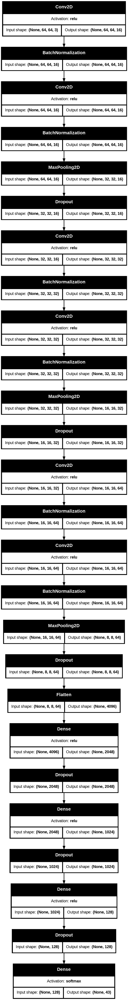

In [ ]:
from keras.src.utils import plot_model
plot_model(model, to_file = 'model.png', show_shapes = True, show_layer_activations=True)